In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                         9.0.1
asttokens                   NA
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.4
cffi                        1.15.0
cloudpickle                 2.0.0
colorama                    0.4.4
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.0
dask                        2022.02.1
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
executing                   0.8.3
fsspec                      2022.02.0
google                      NA
h5py                        3.6.0
igraph                      0.9.9
ipykernel                   6.9.1
ipython_genutils            0.2.0
ipywidgets                  7.6.5
jedi                        0.18.1
jinja2                      2.11.3
joblib                      1.1.0
ju

In [3]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")

  0%|          | 0.00/7.86M [00:00<?, ?B/s]

  0%|          | 0.00/29.3M [00:00<?, ?B/s]

reading C:\Users\Mujtaba Barci\bioimformatic project\data\V1_Human_Lymph_Node\filtered_feature_bc_matrix.h5
 (0:00:01)


C:\Users\Mujtaba Barci\anaconda3\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [5]:
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

### QC and preprocessing

basic filtering

<AxesSubplot:xlabel='n_genes_by_counts'>

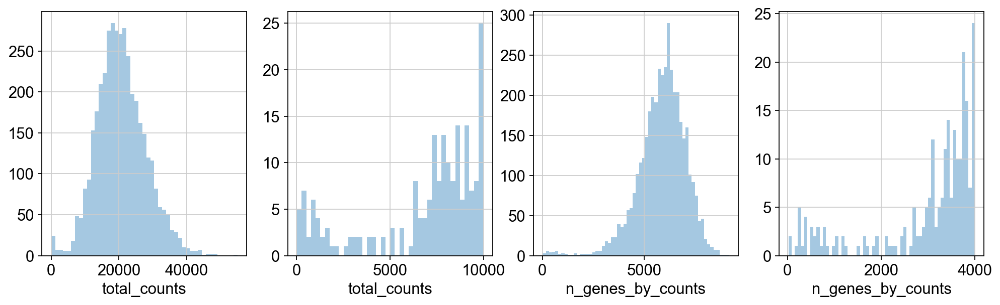

In [9]:

fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])



In [15]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 3861


In [17]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


### Manifold embedding and clustering based on transcriptional similarity

In [18]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes.

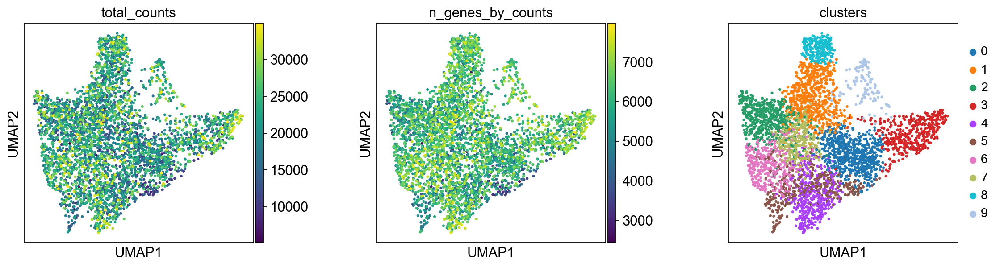

In [19]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

### Visualization in spatial coordinates

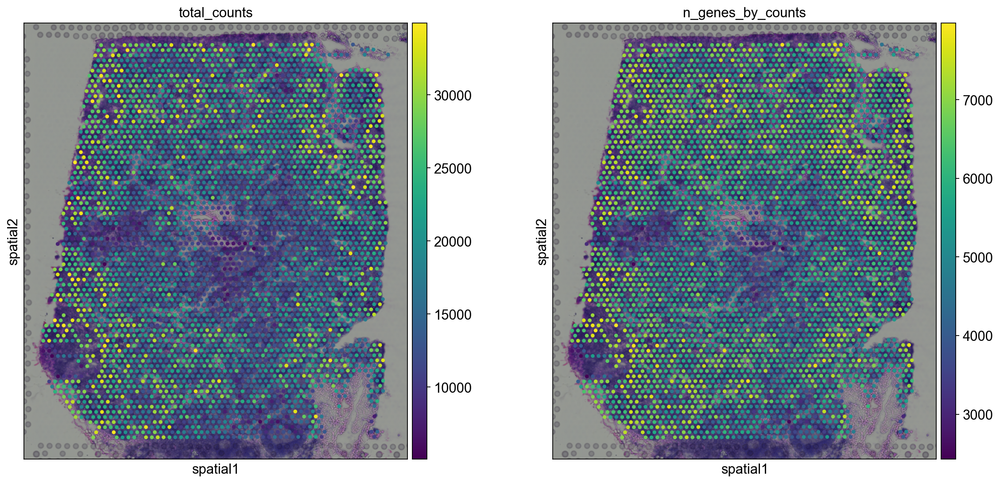

In [21]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

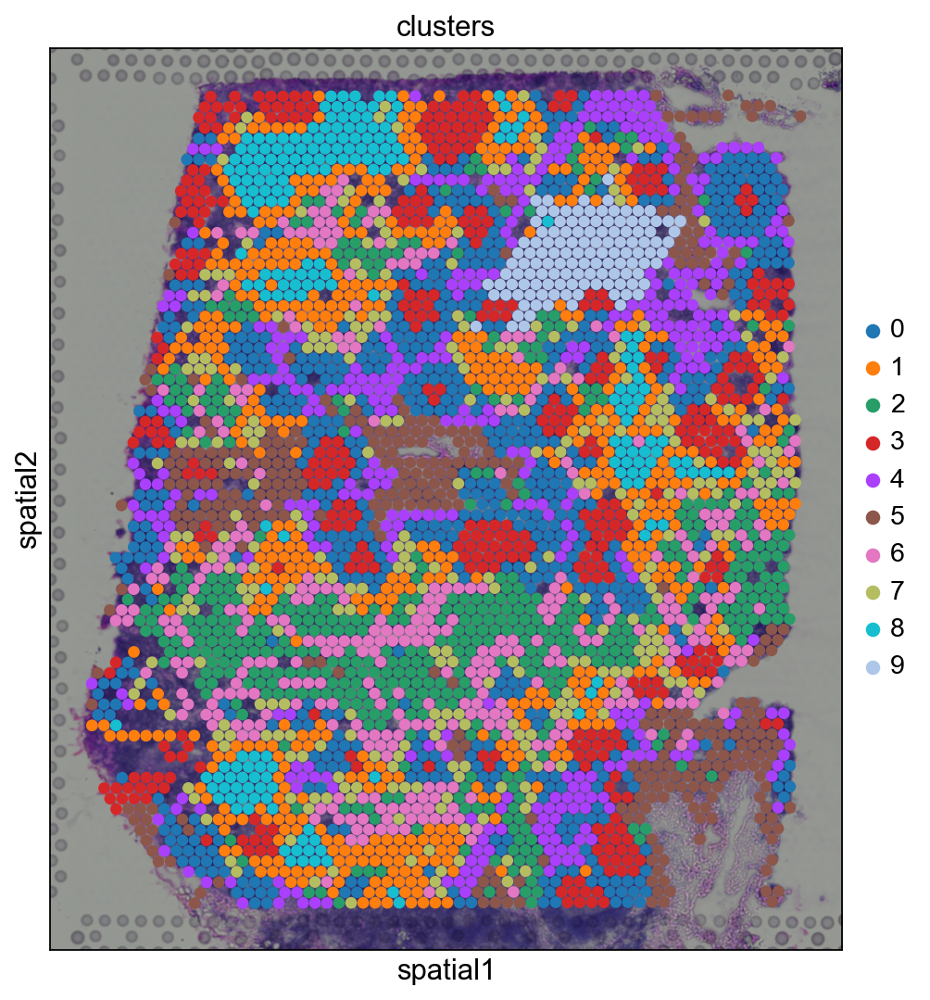

In [22]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)


C:\Users\Mujtaba Barci\anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


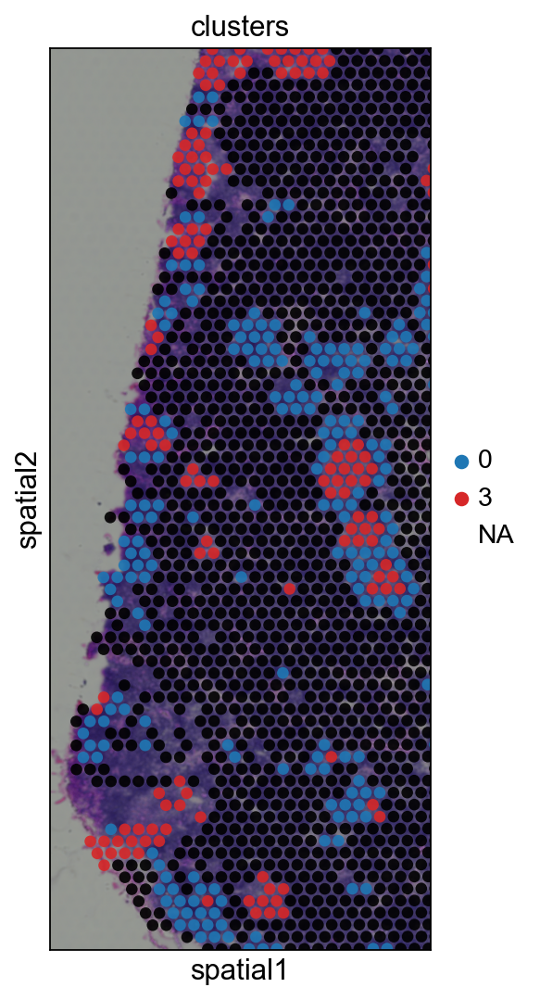

''

In [54]:
sc.pl.spatial(adata, img_key="hires", color="clusters", groups=["0", "3"], crop_coord=[1200, 5000, 1000, 10000], alpha=0.9, size=1.3)
,

### Cluster marker genes


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)
categories: 0, 1, 2, etc.
var_group_labels: 3


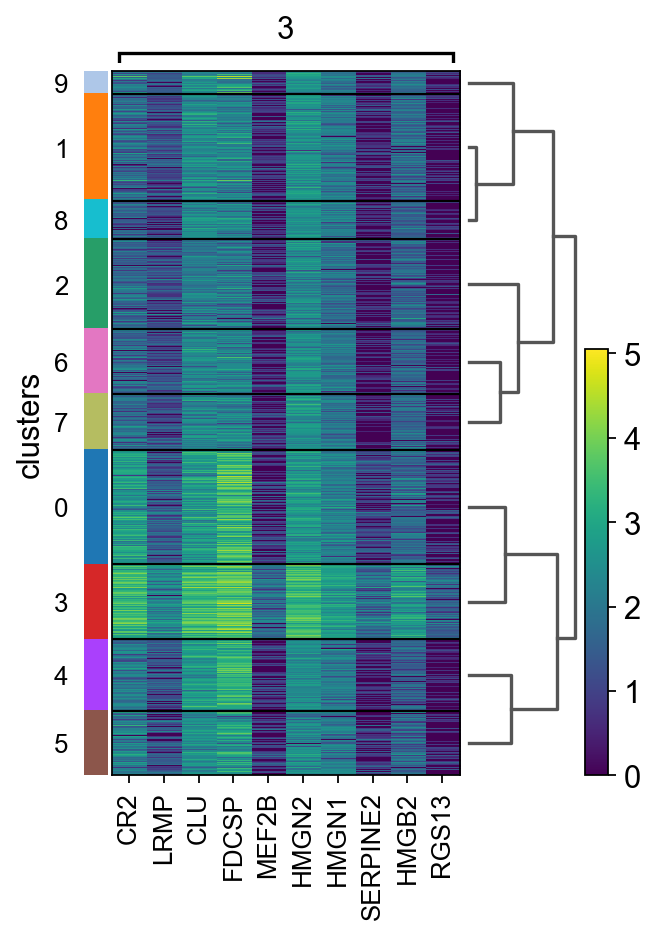

In [57]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="3", n_genes=10, groupby="clusters")

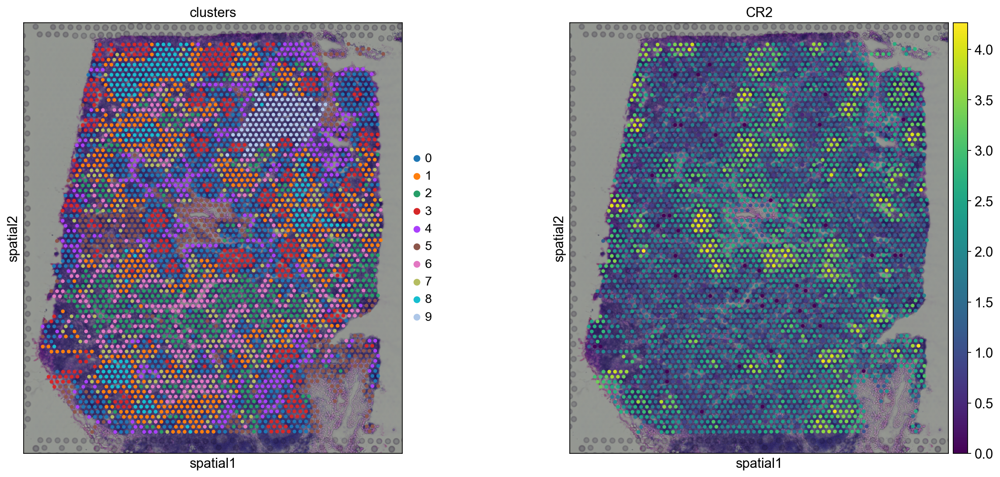

In [58]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])


### Spatially variable genes


In [60]:
import SpatialDE


In [61]:
%%time
counts = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs_names)
coord = pd.DataFrame(adata.obsm['spatial'], columns=['x_coord', 'y_coord'], index=adata.obs_names)
results = SpatialDE.run(coord, counts)

C:\Users\Mujtaba Barci\anaconda3\lib\site-packages\SpatialDE\base.py:26: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])
C:\Users\Mujtaba Barci\anaconda3\lib\site-packages\SpatialDE\base.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])


Models:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

C:\Users\Mujtaba Barci\anaconda3\lib\site-packages\SpatialDE\base.py:178: RuntimeWarning: divide by zero encountered in double_scalars
  s2_logdelta = 1. / (derivative(LL_obj, np.log(max_delta), n=2) ** 2)


  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

CPU times: total: 1h 42min 16s
Wall time: 54min 49s


In [62]:
results.index = results["g"]
adata.var = pd.concat([adata.var, results.loc[adata.var.index.values, :]], axis=1)

In [63]:
results.sort_values("qval").head(10)


,FSV,M,g,l,max_delta,max_ll,max_mu_hat,max_s2_t_hat,model,n,s2_FSV,s2_logdelta,time,BIC,max_ll_null,LLR,pval,qval
g,,,,,,,,,,,,,,,,,,
GNLY,0.076871,4,GNLY,474.158722,11.778479,-2593.983424,0.371093,0.019943,SE,3861,8.269986e-06,0.001380,0.023987,5221.001573,-2676.898328,82.914905,0.0,0.0
IGHM,0.549000,4,IGHM,248.797504,0.817109,-1404.900193,4.412324,1.037201,SE,3861,2.635308e-06,0.000050,0.007994,2842.835112,-2464.120125,1059.219932,0.0,0.0
IGHD,0.221952,4,IGHD,248.797504,3.486772,-3201.847994,1.350073,0.151777,SE,3861,3.930682e-06,0.000135,0.007994,6436.730714,-3450.873927,249.025933,0.0,0.0
IGHG3,0.717894,4,IGHG3,248.797504,0.390866,-2037.617424,4.865079,1.440950,SE,3861,1.471988e-06,0.000039,0.006995,4108.269574,-3717.766627,1680.149203,0.0,0.0
IGHG1,0.787405,4,IGHG1,248.797504,0.268554,-1496.384299,4.437176,1.261307,SE,3861,8.924700e-07,0.000032,0.008994,3025.803324,-3703.575915,2207.191616,0.0,0.0
IGHA1,0.573918,4,IGHA1,248.797504,0.738449,-2542.307066,3.858365,0.925555,SE,3861,2.911812e-06,0.000056,0.002995,5117.648858,-3464.440659,922.133592,0.0,0.0
IGHGP,0.439594,4,IGHGP,248.797504,1.268024,-3444.318884,1.912000,0.381781,SE,3861,3.003057e-06,0.000058,0.004997,6921.672493,-4217.733188,773.414305,0.0,0.0
IGHG2,0.633449,4,IGHG2,248.797504,0.575571,-3179.297647,2.568382,0.681365,SE,3861,1.615847e-06,0.000034,0.005071,6391.630021,-4759.625805,1580.328158,0.0,0.0
IGHG4,0.804869,4,IGHG4,248.797504,0.241144,-1232.529912,5.805479,1.950201,SE,3861,8.659576e-07,0.000035,0.004995,2498.094550,-3458.376521,2225.846609,0.0,0.0


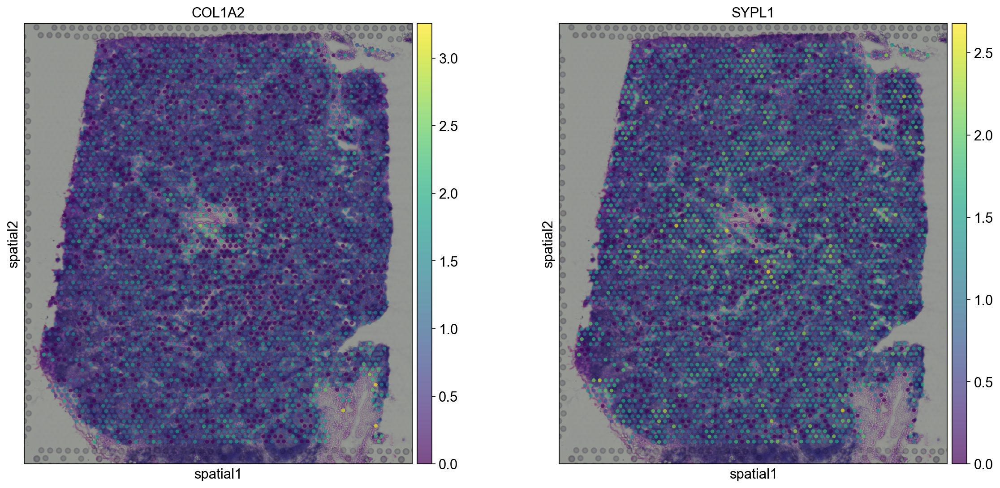

In [64]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)
